In [19]:
import itertools # 반복 객체를 유용하게 다루는 라이브러리
import re  # 정규표현식을 사용할 수 있는 라이브러리
from sklearn.feature_extraction.text import TfidfVectorizer  # tf-idf값을 구하기 위해서 사용
from collections import defaultdict
from collections import Counter   # 단어들을 쉽게 집계하는 라이브러리
from wordcloud import WordCloud
import matplotlib
import matplotlib.pyplot as plt   # 시각화하는 라이브러리
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')   # 선명하게 시각화
font_path = file_path + 'font\\Nanum_Gothic\\NanumGothic-Bold.ttf' 
from sklearn.cluster import KMeans
from tqdm import tqdm_notebook # progress bar
from tqdm import tqdm # 진행률 피드백 라이브러리
from matplotlib import rc, font_manager
import seaborn as sns
rc('font', family='Malgun Gothic')

In [1]:
file_path = 'C:\\daejeon\\data\\' # data가 저장된 파일 경로

In [2]:
import pickle
f = open(file_path + 'data_token_pre1.pkl', "rb") #전처리된 data 불러오기
data = pickle.load(f)
f.close()
data 

,title,doc,url,ch,ch2,token_noun
0,"[공유] 대전 인구유출.. 건설,부동산의 눈으로 보는 해법은?",대전 인구유출 건설부동산의 눈으로 보는 해법은 세종 블랙홀 대전 인구 지속 유출 빨...,https://cafe.naver.com/boodongsan0114/87179?ar...,naver,cafe,"[인구, 유출, 건설, 부동산, 세종, 인구, 지속, 유출, 인구, 유출, 세종, ..."
1,(기사) 대전 브레이크 없는 '인구 유출',대전에 지금까지 수요보다 공급이 적어공급량이 늘어나며 부동산 거래가 활발해졌다고 인...,https://cafe.naver.com/everything1004/40924?ar...,naver,cafe,"[수요, 공급, 공급량, 부동산, 거래, 인식, 인구, 유출, 인구, 가구, 분석,..."
2,대전 인구 유출 심화 관련~!....,리포트대전 브레이크 없는 인구 유출 기사리포트대전 브레이크 없는 인구 유출아무래도...,https://cafe.naver.com/everything1004/40939?ar...,naver,cafe,"[인구, 유출, 인구, 유출, 세종, 영향, 인구, 돌파]"
3,150만 무너진 대전 인구 140만 명도 위험하다,만 무너진 대전 인구 만 명도 위험하다 대전일보중부권 핵심도시 대전시의 인구 하면...,https://cafe.naver.com/rinside/6426?art=ZXh0ZX...,naver,cafe,"[인구, 위험, 대전일보, 핵심, 도시, 인구, 인구 통계, 인구, 인구, 통계, ..."
4,대전시 인구 세종시 인구유출로 147만 무너졌다...,김코치 재테크에서 대전시 세종시의 핫한 뉴스들을 매일 쉽게 올려드립니다우리가 살고...,https://cafe.naver.com/dodamdadam1004/2075015?...,naver,cafe,"[코치, 재테크, 세종, 핫이슈, 모집, 신청, 접수, 코치, 분석, 모집, 주차장..."
...,...,...,...,...,...,...
15267,NaN,이슈탐사전국 상승률 위 폭등한 대전 집값의 비밀 출처 국민일보 네이버 뉴스 높...,NaN,twitter,twitter,"[이슈, 탐사, 상승, 폭등, 집값, 국민일보, 네이버 뉴스]"
15268,NaN,대전집값이 진짜 싸네 카드사도 바로옆이고 두달정도만이라도 내려가서 돈모아야하나,NaN,twitter,twitter,"[집값, 카드사]"
15269,NaN,매일경제 대전 집값 부산 뛰어넘었다,NaN,twitter,twitter,"[경제, 집값]"
15270,NaN,헉 대전 집값 올라요,NaN,twitter,twitter,[집값]


# tf-idf기반 Wordcloud (total)

In [3]:
data_tn = data['token_noun'] #단어만 추출

In [4]:
def cT(readData): 
    text = re.sub('[-=+,#/\?:^$.@*\"※~&%ㆍ!』\\‘|\(\)\[\]\<\>`\'…》]', '', readData) #특수문자 제거
    return text

tn = list(itertools.chain(*data_tn)) #리스트 언패킹
str_tn =cT(str(tn))

In [5]:
aa_list = []
aa_list.append(str_tn)

In [34]:
vectorizer = TfidfVectorizer() # tf-idf값 벡터화
corpus = aa_list
sp_matrix = vectorizer.fit_transform(corpus)

word2id = defaultdict(lambda : 0)
for idx, feature in enumerate(vectorizer.get_feature_names()):
    word2id[feature] = idx

# txt파일을 열어 전체단어의 tf-idf값을 저장
file_a = open(file_path + 'topic5\\tfidf_total.txt', 'w')   

for i, sent in enumerate(corpus):
    a = print('====== document[%d] ======' % i)
    file_a.write(str(a))
    b = [ (token, sp_matrix[i, word2id[token]]) for token in sent.split() ]
    file_a.write(str(b))      
    file_a.write('\n')
file_a.close() 

====== document[0] ======


<Figure size 864x864 with 0 Axes>

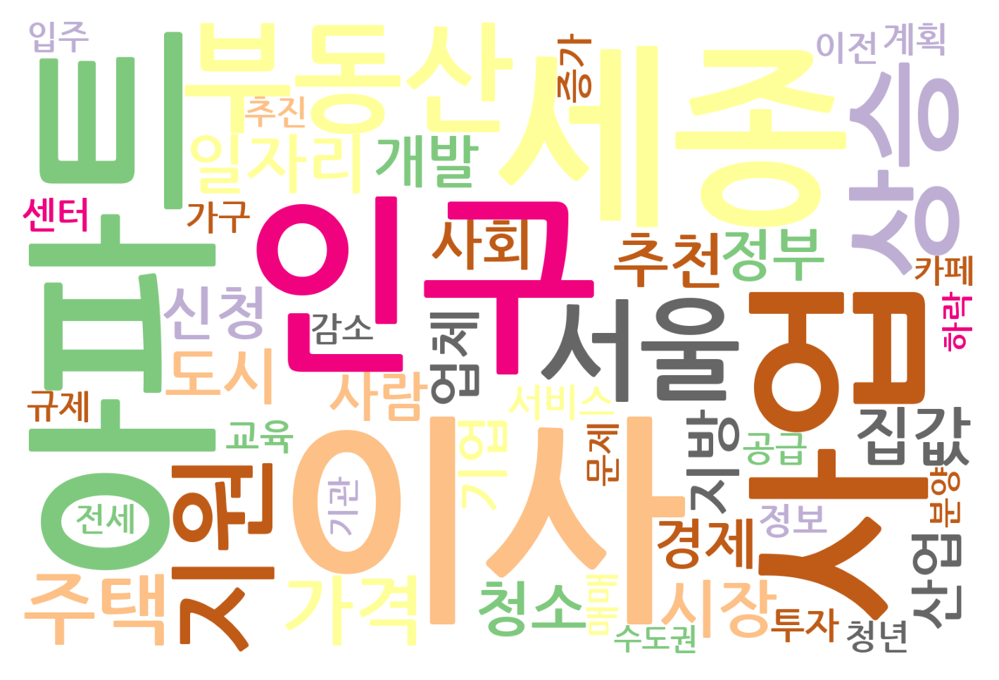

<Figure size 432x288 with 0 Axes>

In [11]:
def pre_tf(text):
    hangul = re.compile('[^ ㄱ-ㅣ가-힣]+')
    num = re.compile('[^0-9]+')
    result = hangul.sub('',text)
    result2 = num.sub('',text)
    result2 = result2[:1] + '.' + result2[1:]
    result2 = round(float(result2),4)
    if result2 > 1 :
        result2 = 0
    return result, result2

def tf_wc(): # 상위 50개의 단어를 워드클라우드로 시각화
    f_tf = open(file_path + 'topic5\\tfidf_total.txt', 'r')
    lines = f_tf.readlines()
    f_tf.close()
    to_lines = set(str(lines).split("),"))  # tf-idf파일에서 각 단어들과 해당 tf-idf값 추출
    total_tf = list(to_lines)
    
    tf_list = []
    to_lines_num = len(set(to_lines))
    for i in range(to_lines_num):
        text = total_tf[i]
        pre_tf(text)
        tf_list.append(pre_tf(text))
    
    data_tn = data['token_noun'] # 각 문서의 명사만 추출
    tn = list(itertools.chain(*data_tn)) # 리스트 언패킹
    count = Counter(tn) # 빈도수 계산
    hund = dict(count.most_common(50)) # 상위빈도수 기반 정렬 후 상위 50개 추출
    
    %matplotlib inline  # 디스플레이 설정(화면 내에 출력)
    wordcloud = WordCloud(font_path = file_path + 'font\\Nanum_Gothic\\NanumGothic-Bold.ttf', background_color='white',colormap = "Accent_r", width=1500, height=1000).generate_from_frequencies(hund) 
    plt.figure(figsize=(12,12))  # witdh, height비율은 유지하면서 보여지는 크기 지정
    plt.figure(dpi=150)  # 해상도
    plt.imshow(wordcloud)
    plt.axis('off') 
    plt.show()  # 워드클라우드 시각화
    plt.savefig(file_path + 'topic5\\total50.png') # 결과 이미지로 저장
    
tf_wc()

<Figure size 864x864 with 0 Axes>

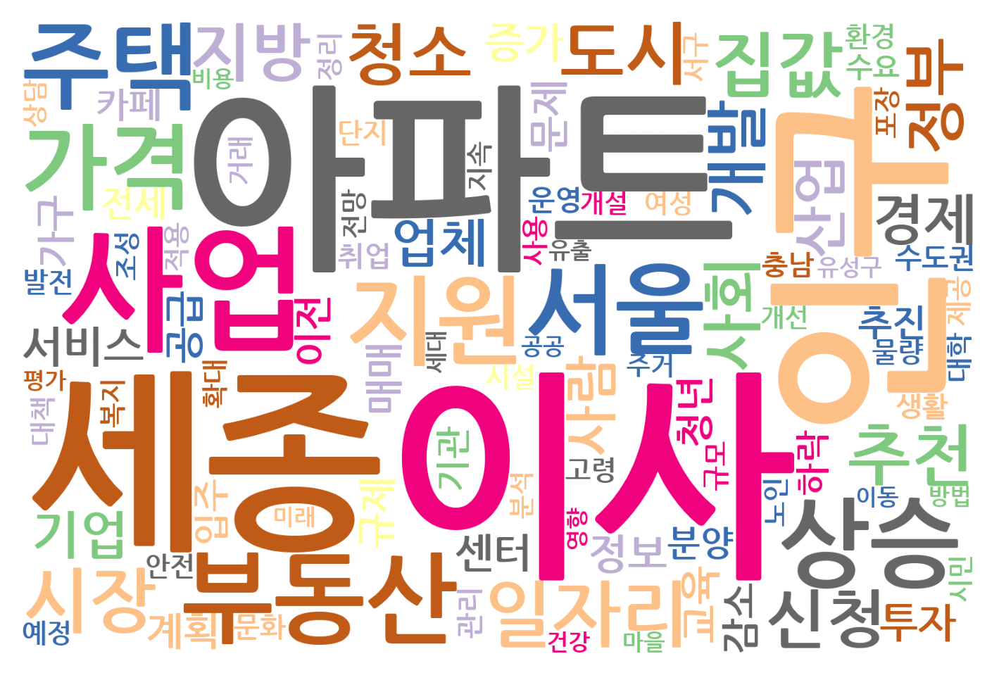

<Figure size 432x288 with 0 Axes>

In [12]:
def pre_tf(text):
    hangul = re.compile('[^ ㄱ-ㅣ가-힣]+')
    num = re.compile('[^0-9]+')
    result = hangul.sub('',text)
    result2 = num.sub('',text)
    result2 = result2[:1] + '.' + result2[1:]
    result2 = round(float(result2),4)
    if result2 > 1 :
        result2 = 0
    return result, result2

def tf_wc(): # 상위 100개의 단어를 워드클라우드로 시각화
    f_tf = open(file_path + 'topic5\\tfidf_total.txt', 'r')
    lines = f_tf.readlines()
    f_tf.close()
    to_lines = set(str(lines).split("),"))  # tf-idf파일에서 각 단어들과 해당 tf-idf값 추출
    topic_tf = list(to_lines)
    
    tf_list = []
    to_lines_num = len(set(to_lines))
    for i in range(to_lines_num):
        text = topic_tf[i]
        pre_tf(text)
        tf_list.append(pre_tf(text))
    
    data_tn = data['token_noun'] # 전체 문서의 명사만 추출
    tn = list(itertools.chain(*data_tn)) # 리스트 언패킹
    count = Counter(tn) # 빈도수 계산
    hund = dict(count.most_common(100)) # 상위빈도수 기반 정렬 후 상위 100개 추출
    
    %matplotlib inline  # 디스플레이 설정(화면 내에 출력)
    wordcloud = WordCloud(font_path = file_path + 'font\\Nanum_Gothic\\NanumGothic-Bold.ttf', background_color='white',colormap = "Accent_r", width=1500, height=1000).generate_from_frequencies(hund) 
    plt.figure(figsize=(12,12))  # witdh, height비율은 유지하면서 보여지는 크기 지정
    plt.figure(dpi=150)  # 해상도
    plt.imshow(wordcloud)
    plt.axis('off') 
    plt.show()  # 워드클라우드 시각화
    plt.savefig(file_path + 'topic5\\total100.png') # 결과 이미지로 저장
    
tf_wc()

In [14]:
#단어 수 확인
noun = list(itertools.chain(*data['token_noun']))
count = Counter(noun)
total = len(list(set(noun)))
total

47139

In [15]:
#단어의 등장횟수 확인
len(noun) 

2449541

# Wordcloud (keyword)

In [42]:
total_docs = data

def cT(readData): # 특수문자 제거
    text = re.sub('[-=+,#/\?:^$.@*\"※~&%ㆍ!』\\‘|\(\)\[\]\<\>`\'…》]', '', readData)
    return text

def hh(x):
    count = []
    index_list = []
    for i in range(len(total_docs)):
        if  x in total_docs['doc'][i]: # 해당 키워드 x가 포함된 문서 추출
            index_list.append(total_docs['token_noun'][i])
    noun_list2 = list(itertools.chain(*index_list)) # 리스트 언패킹
    str_ = cT(str(noun_list2))
    aaa_list = []
    aaa_list.append(str_)
    return aaa_list

In [45]:
vectorizer = TfidfVectorizer()
corpus = hh('인구문제')
sp_matrix = vectorizer.fit_transform(corpus)

word2id = defaultdict(lambda : 0)
for idx, feature in enumerate(vectorizer.get_feature_names()):
    word2id[feature] = idx

# txt파일을 열어'인구문제'관련 키워드의 tf-idf값을 저장
file_a = open(file_path + 'topic5\\tfidf_keyword1.txt', 'w')   

for i, sent in enumerate(corpus):
    a = print('====== document[%d] ======' % i)
    file_a.write(str(a))
    b = [ (token, sp_matrix[i, word2id[token]]) for token in sent.split() ]
    file_a.write(str(b))      # 파일에 문자열 저장
    file_a.write('\n')
file_a.close() 

====== document[0] ======


In [46]:
vectorizer = TfidfVectorizer()
corpus = hh('인구이동')
sp_matrix = vectorizer.fit_transform(corpus)

word2id = defaultdict(lambda : 0)
for idx, feature in enumerate(vectorizer.get_feature_names()):
    word2id[feature] = idx
    
# txt파일을 열어'인구이동'관련 키워드의 tf-idf값을 저장
file_a = open(file_path + 'topic5\\tfidf_keyword2.txt', 'w')  

for i, sent in enumerate(corpus):
    a = print('====== document[%d] ======' % i)
    file_a.write(str(a))
    b = [ (token, sp_matrix[i, word2id[token]]) for token in sent.split() ]
    file_a.write(str(b))      # 파일에 문자열 저장
    file_a.write('\n')
file_a.close() 

====== document[0] ======


In [47]:
vectorizer = TfidfVectorizer()
corpus = hh('지역경제')
sp_matrix = vectorizer.fit_transform(corpus)

word2id = defaultdict(lambda : 0)
for idx, feature in enumerate(vectorizer.get_feature_names()):
    word2id[feature] = idx
    
# txt파일을 열어'지역경제'관련 키워드의 tf-idf값을 저장
file_a = open(file_path + 'topic5\\tfidf_keyword3.txt', 'w')

for i, sent in enumerate(corpus):
    a = print('====== document[%d] ======' % i)
    file_a.write(str(a))
    b = [ (token, sp_matrix[i, word2id[token]]) for token in sent.split() ]
    file_a.write(str(b))      # 파일에 문자열 저장
    file_a.write('\n')
file_a.close() 

====== document[0] ======


In [48]:
vectorizer = TfidfVectorizer()
corpus = hh('인구유출')
sp_matrix = vectorizer.fit_transform(corpus)

word2id = defaultdict(lambda : 0)
for idx, feature in enumerate(vectorizer.get_feature_names()):
    word2id[feature] = idx

# txt파일을 열어'인구유출'관련 키워드의 tf-idf값을 저장
file_a = open(file_path + 'topic5\\tfidf_keyword4.txt', 'w')    

for i, sent in enumerate(corpus):
    a = print('====== document[%d] ======' % i)
    file_a.write(str(a))
    b = [ (token, sp_matrix[i, word2id[token]]) for token in sent.split() ]
    file_a.write(str(b))      # 파일에 문자열 저장
    file_a.write('\n')
file_a.close() 

====== document[0] ======


In [49]:
vectorizer = TfidfVectorizer()
corpus = hh('저출산')
sp_matrix = vectorizer.fit_transform(corpus)

word2id = defaultdict(lambda : 0)
for idx, feature in enumerate(vectorizer.get_feature_names()):
    word2id[feature] = idx

# txt파일을 열어'저출산'관련 키워드의 tf-idf값을 저장
file_a = open(file_path + 'topic5\\tfidf_keyword5.txt', 'w')    

for i, sent in enumerate(corpus):
    a = print('====== document[%d] ======' % i)
    file_a.write(str(a))
    b = [ (token, sp_matrix[i, word2id[token]]) for token in sent.split() ]
    file_a.write(str(b))      # 파일에 문자열 저장
    file_a.write('\n')
file_a.close() 

====== document[0] ======


In [50]:
vectorizer = TfidfVectorizer()
corpus = hh('고령화')
sp_matrix = vectorizer.fit_transform(corpus)

word2id = defaultdict(lambda : 0)
for idx, feature in enumerate(vectorizer.get_feature_names()):
    word2id[feature] = idx

# txt파일을 열어'고령화'관련 키워드의 tf-idf값을 저장
file_a = open(file_path + 'topic5\\tfidf_keyword6.txt', 'w')  

for i, sent in enumerate(corpus):
    a = print('====== document[%d] ======' % i)
    file_a.write(str(a))
    b = [ (token, sp_matrix[i, word2id[token]]) for token in sent.split() ]
    file_a.write(str(b))      # 파일에 문자열 저장
    file_a.write('\n')
file_a.close() 

====== document[0] ======


In [51]:
vectorizer = TfidfVectorizer()
corpus = hh('이사')
sp_matrix = vectorizer.fit_transform(corpus)

word2id = defaultdict(lambda : 0)
for idx, feature in enumerate(vectorizer.get_feature_names()):
    word2id[feature] = idx

# txt파일을 열어'이사'관련 키워드의 tf-idf값을 저장
file_a = open(file_path + 'topic5\\tfidf_keyword7.txt', 'w')    

for i, sent in enumerate(corpus):
    a = print('====== document[%d] ======' % i)
    file_a.write(str(a))
    b = [ (token, sp_matrix[i, word2id[token]]) for token in sent.split() ]
    file_a.write(str(b))      # 파일에 문자열 저장
    file_a.write('\n')
file_a.close() 

====== document[0] ======


In [52]:
vectorizer = TfidfVectorizer()
corpus = hh('일자리')
sp_matrix = vectorizer.fit_transform(corpus)

word2id = defaultdict(lambda : 0)
for idx, feature in enumerate(vectorizer.get_feature_names()):
    word2id[feature] = idx

# txt파일을 열어'일자리'관련 키워드의 tf-idf값을 저장
file_a = open(file_path + 'topic5\\tfidf_keyword8.txt', 'w')  

for i, sent in enumerate(corpus):
    a = print('====== document[%d] ======' % i)
    file_a.write(str(a))
    b = [ (token, sp_matrix[i, word2id[token]]) for token in sent.split() ]
    file_a.write(str(b))      # 파일에 문자열 저장
    file_a.write('\n')
file_a.close() 

====== document[0] ======


In [53]:
vectorizer = TfidfVectorizer()
corpus = hh('집값')
sp_matrix = vectorizer.fit_transform(corpus)

word2id = defaultdict(lambda : 0)
for idx, feature in enumerate(vectorizer.get_feature_names()):
    word2id[feature] = idx

# txt파일을 열어'집값'관련 키워드의 tf-idf값을 저장
file_a = open(file_path + 'topic5\\tfidf_keyword9.txt', 'w')   

for i, sent in enumerate(corpus):
    a = print('====== document[%d] ======' % i)
    file_a.write(str(a))
    b = [ (token, sp_matrix[i, word2id[token]]) for token in sent.split() ]
    file_a.write(str(b))      # 파일에 문자열 저장
    file_a.write('\n')
file_a.close() 

====== document[0] ======


<Figure size 432x288 with 0 Axes>

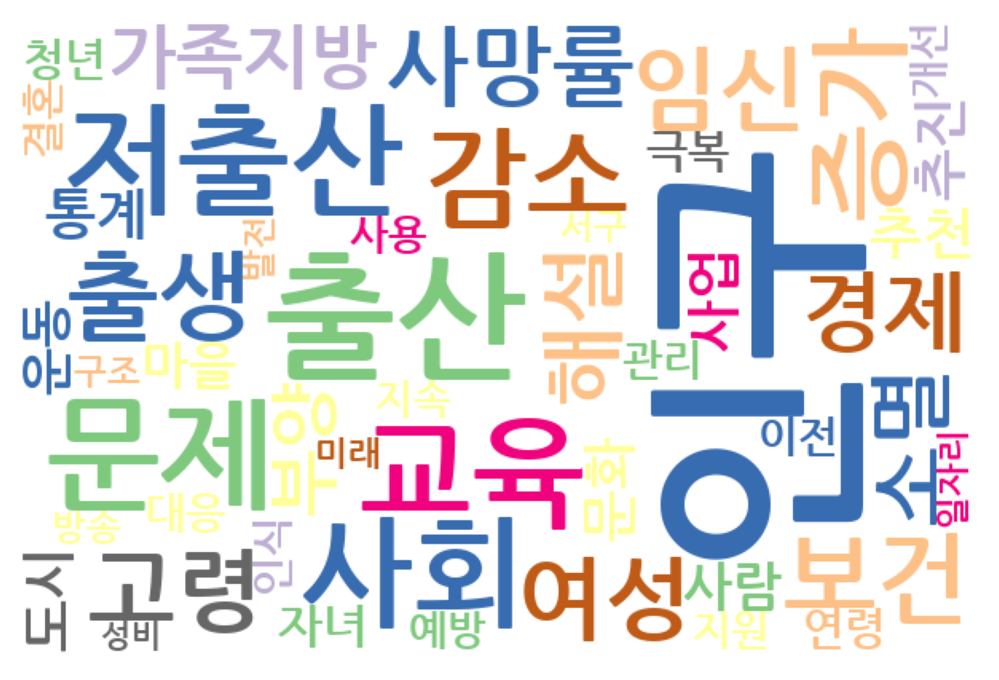

<Figure size 432x288 with 0 Axes>

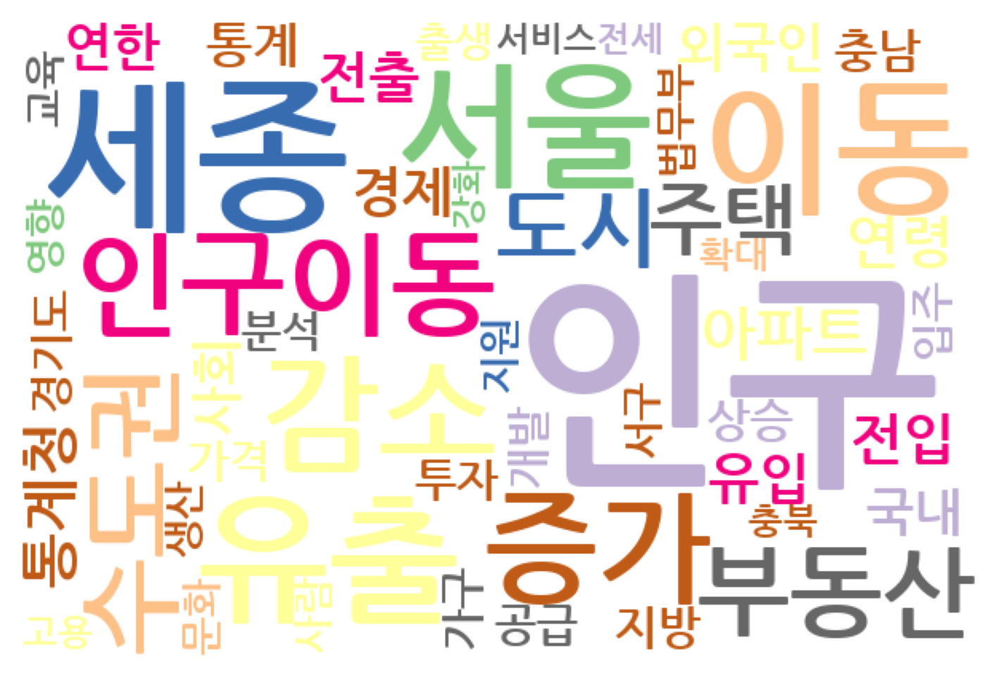

<Figure size 432x288 with 0 Axes>

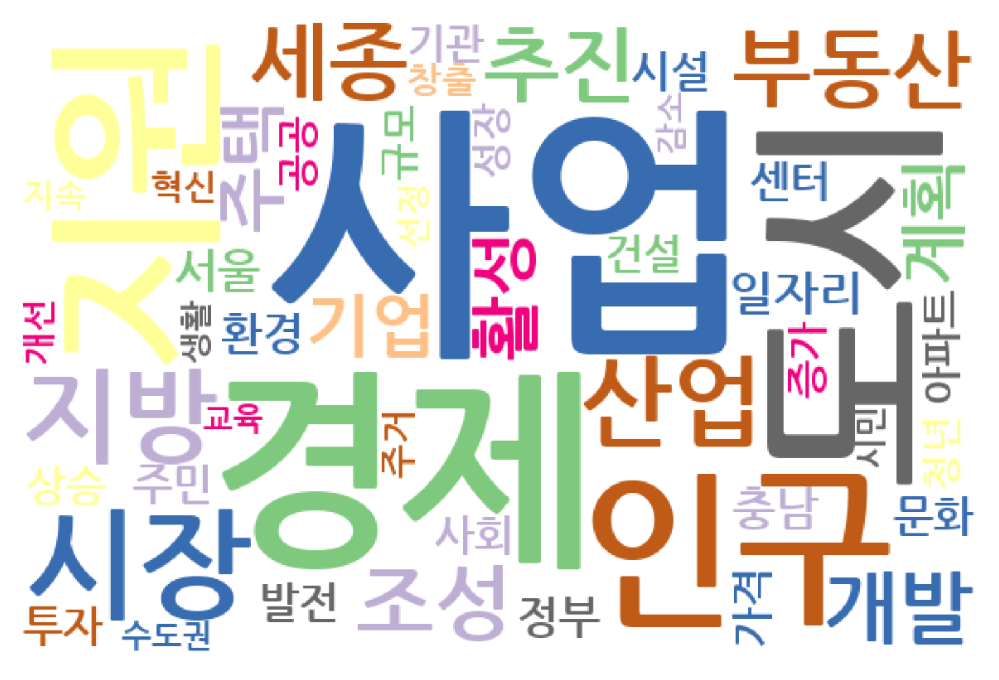

<Figure size 432x288 with 0 Axes>

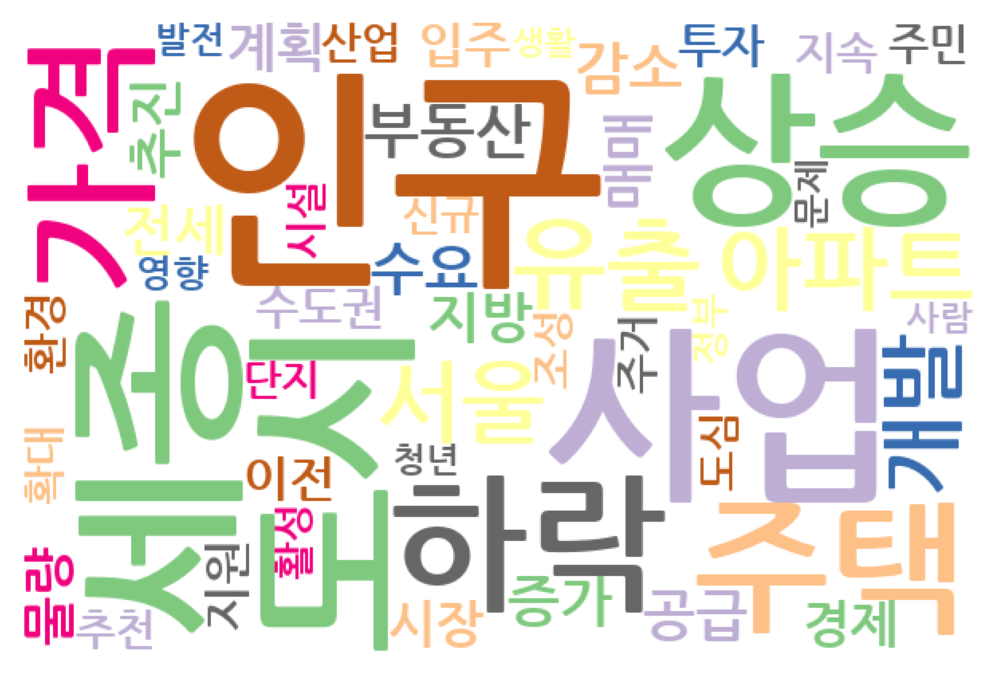

<Figure size 432x288 with 0 Axes>

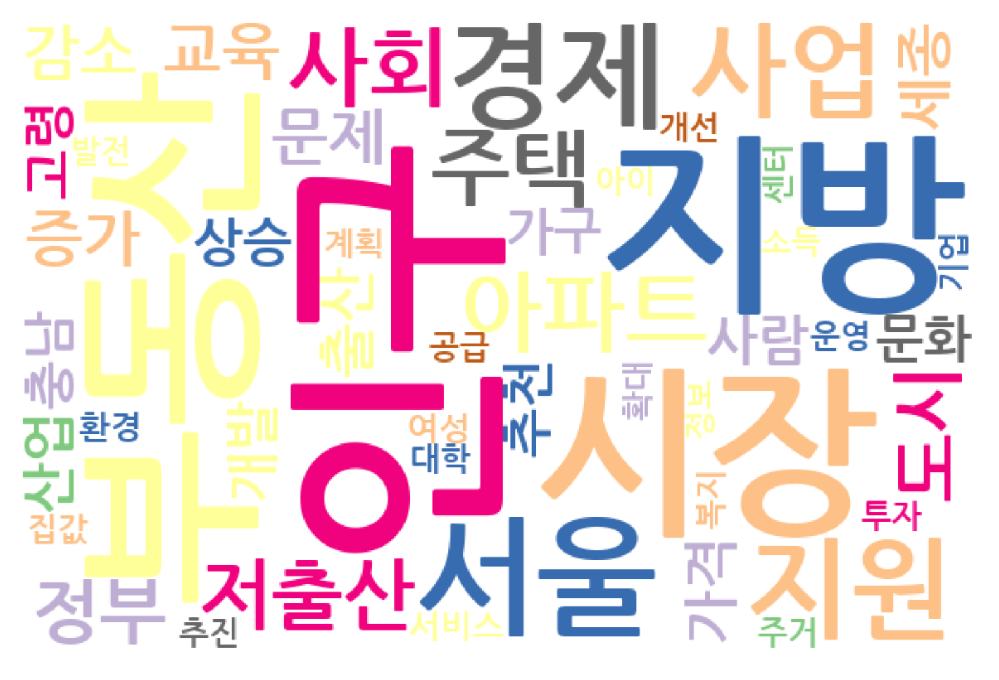

<Figure size 432x288 with 0 Axes>

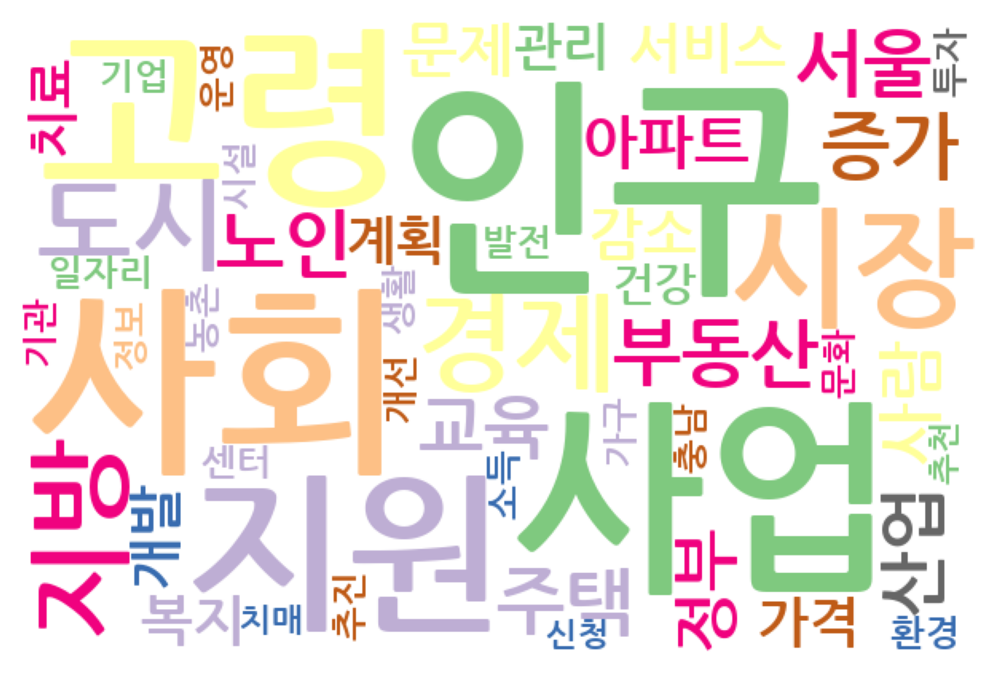

<Figure size 432x288 with 0 Axes>

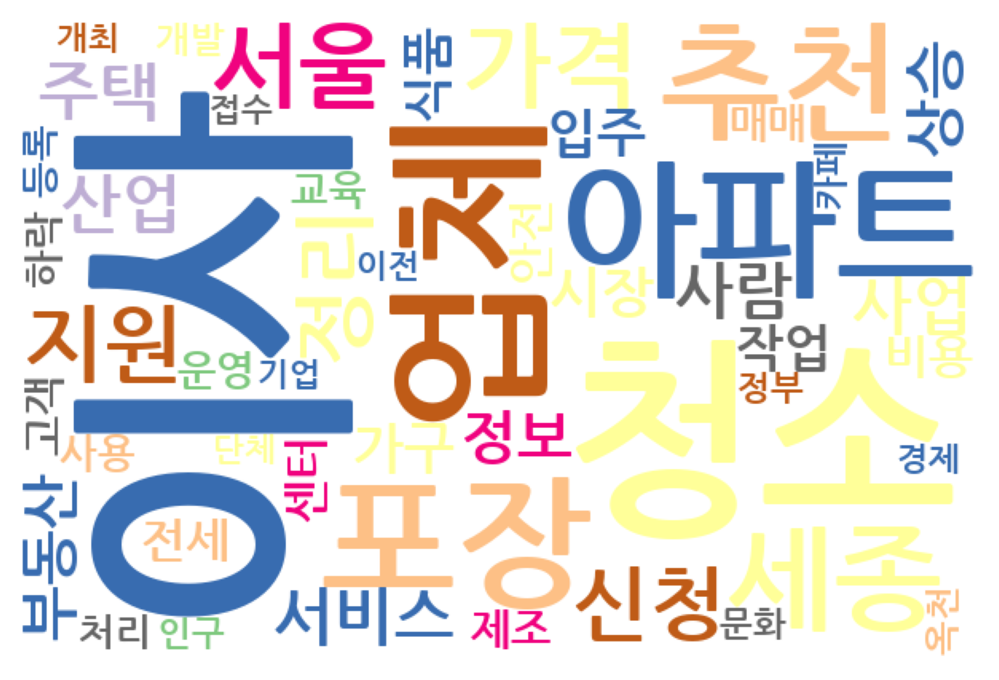

<Figure size 432x288 with 0 Axes>

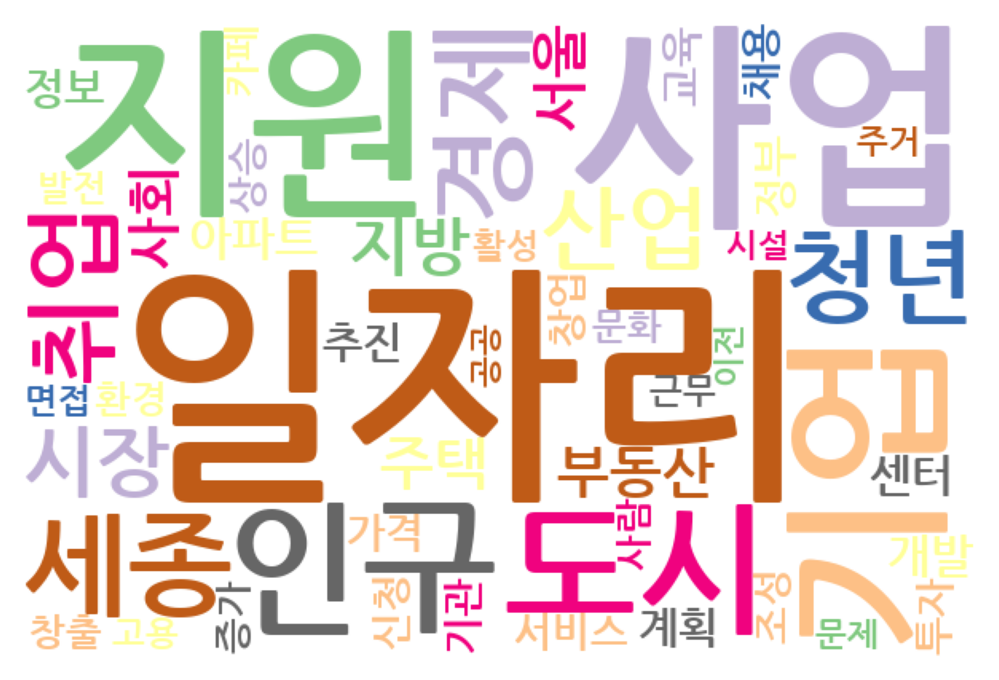

<Figure size 432x288 with 0 Axes>

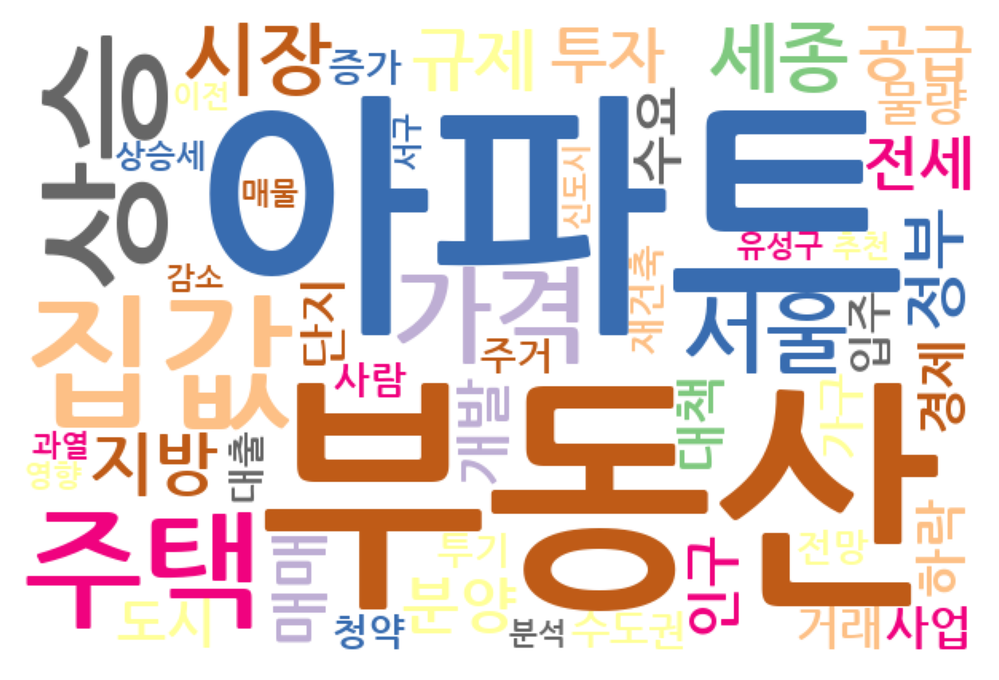

In [20]:
def hh(x):
    count = []
    index_list = []
    for i in range(len(total_docs)):
        if  x in total_docs['doc'][i]: # 해당 키워드 x가 포함된 문서의 인덱스를 가져옴
            count.append(i)
    count = list(set(count))
    for i in range(len(count)):
        index_list.append(total_docs['token_noun'][count[i]])
    noun_list2 = list(itertools.chain(*index_list)) #리스트 언패킹
    count = Counter(noun_list2) # 빈도수 계산
    hund = dict(count.most_common(50)) # 상위 50개 출력하기
    return(hund)

def wc(hund):
    %matplotlib inline  
    wordcloud = WordCloud(font_path = font_path, background_color='white',colormap = "Accent", width=600, height=400).generate_from_frequencies(hund) 
    plt.figure(figsize=(6,4)) # witdh, height비율은 유지하면서 보여지는 크기 지정
    plt.figure(dpi=150) # 해상도
    plt.imshow(wordcloud) 
    plt.axis('off') 
    plt.show() # 워드클라우드 시각화
    
wc(hh('인구문제'))
wc(hh('인구이동'))
wc(hh('지역경제'))
wc(hh('인구유출'))
wc(hh('저출산'))
wc(hh('고령화'))
wc(hh('이사'))
wc(hh('일자리'))
wc(hh('집값'))

# KMeans

In [25]:
data['token_noun']

0        [인구, 유출, 건설, 부동산, 세종, 인구, 지속, 유출, 인구, 유출, 세종, ...
1        [수요, 공급, 공급량, 부동산, 거래, 인식, 인구, 유출, 인구, 가구, 분석,...
2                         [인구, 유출, 인구, 유출, 세종, 영향, 인구, 돌파]
3        [인구, 위험, 대전일보, 핵심, 도시, 인구, 인구 통계, 인구, 인구, 통계, ...
4        [코치, 재테크, 세종, 핫이슈, 모집, 신청, 접수, 코치, 분석, 모집, 주차장...
                               ...                        
15267                   [이슈, 탐사, 상승, 폭등, 집값, 국민일보, 네이버 뉴스]
15268                                            [집값, 카드사]
15269                                             [경제, 집값]
15270                                                 [집값]
15271                                             [이사, 고려]
Name: token_noun, Length: 15272, dtype: object

In [26]:
doc_noun = []
for i in range(0,len(data['token_noun'])):
    doc_noun.append(' '.join(data['token_noun'][i]))  # 각 문서의 명사들을 str으로 연결     #['문서1 명사', '문서2 명사', '...']

In [27]:
doc_noun

['인구 유출 건설 부동산 세종 인구 지속 유출 인구 유출 세종 인구 도시 완성 기대감 주택 매매 지속 상승 인구 유출 세종 인구 도시 완성 기대감 주택 매매 지속 상승 수요자 이동 벤처기업 세종 이전 계획 인구 유출 위기 건설 정비 부동산 업계 유성구 관광지 주택 공급 활성 위기 돌파 위기 인구 유출 문제 건설업 정비 업계 대응 방안 지자체 계획 인구 유출 건설 부동산 세종 인구 지속 유출 정비 사업 활성 도심 개발 유성 관광 자원 인구 유출 방지 방안 세종 인구 지속 유출 세종 인구 유출 인구 도시 인구 세종 건설 부동산 업계 개발 재건축 정비 사업 활성 신도시인 개발 주택 공급 공급 주택 가격 안정 유성 시장 관광 자원 개발 인구 유출 메가시티 중심축 도약 발판 마련 세종 시가 세종 통계 인구 증가 시가 인구 세종 전입 인구 충북 충남 충청 전입 인구 인구 세종 유입 완성 주택 가격 상승 기대감 투자 수요 실수요자 세종 유입 인구 유출 세종 아파트 매매 누적 상승 수요 이동 부동산 아파트 가격 세종 아파트 매매 누적 상승 상승 매매 전세 물량 수요 집중 가격 상승 혁신도시 매매 상승 수요 이동 부동산 정비 사업 활성 지원 주택 공급 신도시 개발 세종 인접 유성 유성 시장 관광 자원 인구 유출 인구 유입 과학기술 부동산 금융 부동산 유석 인구 유출 부동산 주택 가격 주거 환경 정비 사업 활성 지원 주택 공급 주택 공급 가격 안정 도심 개발 인구 유출 방지 유성 시장 유성온천 관광 자원 개선 사람 마련 인구 유출 방지 인구 유입 방안 관광지',
 '수요 공급 공급량 부동산 거래 인식 인구 유출 인구 가구 분석 인구 유출 인구 유출 통계 인구 유출 인구 유출 대책 마련 인구 유출 도시 개발 보도 마지노선 인구 인구 인구 유입 인구 유출 인구 인구 유출 유출 인구수 도시 사람 세종 사회 간접 자본 투자가 주택 일자리 창출 인구 유출 분석 전시 아이 마련 산업 육성 도시 경쟁력 인구 유출 방지 인구 아이 구축 청년 신혼부부 주택 공급 계획 인구 인구수 개발 인구 

- TF(단어 빈도): 특정 단어가 하나의 문서에 얼마나 자주 등장하는지를 나타내는 값. 
- DF(문서 빈도): 특정 단어가 여러 문서에 얼마나 자주 등장하는지를 나타내는 값. (이 값의 역수:IDF)
- TF값이 높을수록 문서에서 중요, DF값이 높을수록 중요도는 낮아짐
- TF-IDF: TF와 IDF를 곱한 값.  점수가 높은 단어일수록 다른 문서에는 많지 않고 해당 문서에서 자주 등장하는 단어(분별력 있는 특징)

In [28]:
# 텍스트 문서 모음을 단어 tf-idf 행렬로 변환 
vec = TfidfVectorizer(min_df = 0.01, max_df=0.95) # 문서의 1%~95%로 나타나는 단어만 고려.  #min_df: 특정 단어가 나타나는 '문서의 수의 최소 빈도값을 설정/소수형태면 %로 설정
X = vec.fit_transform(doc_noun) # 설정한 Vectorizer로 벡터화

In [116]:
print(vec.get_feature_names())  # 단어 가나다 순 인덱스 

['가게', '가격', '가공', '가구', '가능', '가량', '가스', '가요', '가을', '가전', '가족', '가치', '간담회', '간접', '갈등', '감당', '감독', '감동', '감사', '감소', '감소세', '감안', '감정', '갑천', '강도', '강북', '강사', '강원도', '강제', '강화', '개발', '개방', '개별', '개선', '개설', '개시', '개요', '개인', '개정', '개정안', '개최', '개통', '개편', '개혁', '거래', '거래량', '거리', '거점', '거주', '거주자', '거주지', '거품', '걱정', '건강', '건립', '건물', '건설', '건설사', '건수', '건의', '건축', '건축물', '검증', '검진', '게시', '게임', '겨울', '격차', '견인', '결정', '결합', '결혼', '경계', '경고', '경기도', '경력', '경비', '경영', '경쟁', '경쟁력', '경제', '경찰', '경향', '계약', '계약서', '계절', '계좌', '계획', '고가', '고개', '고객', '고공', '고급', '고도', '고등학교', '고려', '고령', '고령자', '고령화사회', '고민', '고생', '고속도로', '고용', '고장', '고통', '고향', '골프', '곰팡이', '공감', '공고', '공공', '공급', '공급량', '공기', '공기업', '공단', '공동체', '공무원', '공시', '공식', '공약', '공업', '공연', '공원', '공인', '공인중개사', '공장', '공정', '공제', '공지', '공항', '과다', '과세', '과열', '과잉', '과학기술', '관광', '관광객', '관내', '관리', '관심', '관심사', '관점', '관측', '광장', '교류', '교사', '교실', '교육', '교육과정', '교육부', '교육원', '교육청', '교체', '교통', '교통망', '교통부', '구경', '구로', '구매', 

In [117]:
print(X)  # (문서인덱스, 등장단어안덱스) tf-idf값

  (0, 482)	0.019050433920409802
  (0, 33)	0.02466769736746938
  (0, 1290)	0.022906463160613323
  (0, 996)	0.026701112968571587
  (0, 192)	0.03054159221000019
  (0, 135)	0.03780209352764383
  (0, 871)	0.03390668988458003
  (0, 650)	0.029720088253687566
  (0, 1039)	0.03563818991294396
  (0, 1267)	0.034028171528146495
  (0, 1067)	0.026683373003054827
  (0, 355)	0.027234164579289663
  (0, 938)	0.026224758027127894
  (0, 246)	0.07257650443212754
  (0, 690)	0.056843743603235776
  (0, 667)	0.03514618171597706
  (0, 609)	0.09438049315825778
  (0, 1195)	0.022731098465309574
  (0, 813)	0.11334823142218906
  (0, 1144)	0.02808506403157369
  (0, 1138)	0.02401813289479549
  (0, 1142)	0.027637854446800274
  (0, 943)	0.0718942776828837
  (0, 1025)	0.02184615509769914
  (0, 1184)	0.029327480795678994
  :	:
  (15261, 1063)	0.26338476601878735
  (15261, 938)	0.33936248953528225
  (15262, 100)	1.0
  (15263, 844)	0.4463891696993969
  (15263, 535)	0.8948389291794826
  (15264, 1063)	0.6910476865525039
  (152

1
2
3
4
5
6
7
8
9


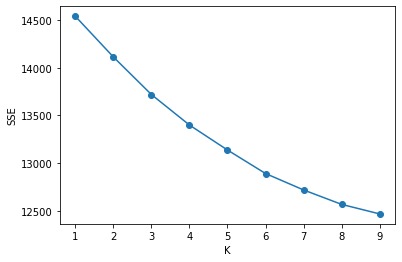

In [118]:
# 군집수가 1~9개일때로 elbow 그래프 시각화
def elbow(X):
    sse = []

    for i in range(1,10):
        km = KMeans(n_clusters=i, algorithm='auto', random_state=1)  #k-means algorithm: auto(기본값))
        km.fit(X) # k-means clustering
        sse.append(km.inertia_)
        print(i)
        
    plt.plot(range(1,10), sse, marker='o')
    plt.xlabel('K')
    plt.ylabel('SSE')
    plt.xticks(range(1,10))
    plt.show()

elbow(X)

In [29]:
# 최적의 클러스터 수(5)로 k-means 실행
from sklearn.cluster import KMeans
model = KMeans(n_clusters=5, algorithm='auto', random_state=0)
model.fit(X)

KMeans(n_clusters=5, random_state=0)

In [30]:
print("Top terms per cluster:")
order_centroids = model.cluster_centers_.argsort()[:, ::-1]   
terms = vec.get_feature_names()  # 벡터에 해당하는 단어
for i in range(5):
    print("Cluster %d:" % i)
    for ind in order_centroids[i, :30]:   # [행, 열]     # [클러스터 인덱스, 클러스터 내 인덱스]
        print(' %s' % terms[ind])   # ind: 가져온 단어 인덱스    #terms[ind]: 해당 인덱스를 가진 단어
    print('\n')

Top terms per cluster:
Cluster 0:
 신청
 개설
 실패
 초과
 이사
 사람
 일자리
 여행
 사회
 행복
 교육
 건강
 마을
 아파트
 서울
 음악
 사용
 인생
 신문
 인구
 정보
 정치
 감사
 생활
 경제
 행사
 부동산
 카페
 문화
 학생


Cluster 1:
 이사
 청소
 포장
 업체
 정리
 추천
 비용
 먼지
 고객
 작업
 이삿짐
 서비스
 원룸
 입주
 만족
 소요
 익스프레스
 제거
 아파트
 비교
 걱정
 후기
 곰팡이
 가구
 친절
 감사
 정보
 오염
 상담
 지원


Cluster 2:
 집값
 상승
 아파트
 부동산
 가격
 주택
 세종
 서울
 규제
 전세
 매매
 시장
 분양
 하락
 공급
 투자
 정부
 지방
 수요
 물량
 대책
 상승세
 단지
 거래
 청약
 투기
 입주
 개발
 수도권
 대출


Cluster 3:
 추천
 관심사
 사람
 미디어
 정보
 이벤트
 이사
 이전
 알바
 서울
 보도
 조회
 집값
 문제
 사회
 상담
 부동산
 세종
 병원
 인구
 감사
 저출산
 정치
 금융
 어린이
 리뷰
 예술
 행복
 취업
 축하


Cluster 4:
 일자리
 인구
 사업
 세종
 지원
 기업
 취업
 청년
 사회
 도시
 카페
 교육
 센터
 신청
 이사
 경제
 산업
 노인
 기관
 추진
 문제
 서울
 서비스
 면접
 정보
 고령
 사람
 문화
 계획
 대전일보




In [31]:
model.cluster_centers_ 
# 각 Feature(단어)들과 클러스터 중심간의 상대적인 위치
# 위치값들은 0~1사이의 값들로 나오며, 1로 갈수록 Feature와 클러스터 중심거리가 멀리 떨어진 것이 아닌 가장 가깝고 관계가 있다는 의미 

array([[0.00000000e+00, 4.35109574e-03, 4.88668954e-04, ...,
        5.17901483e-03, 3.09212839e-03, 0.00000000e+00],
       [2.73786003e-03, 1.70284070e-02, 0.00000000e+00, ...,
        4.64991585e-04, 8.97097472e-05, 1.86345902e-05],
       [8.43976902e-04, 1.05922047e-01, 8.17451741e-04, ...,
        1.62861776e-03, 3.63364939e-04, 4.14473048e-03],
       [6.34282373e-03, 6.07473372e-03, 2.25609287e-04, ...,
        2.48949063e-03, 5.56864640e-04, 0.00000000e+00],
       [2.11473908e-03, 4.48322227e-03, 1.82827096e-03, ...,
        7.66621123e-03, 1.54265067e-03, 5.15505685e-04]])

In [32]:
model.cluster_centers_.argsort()  # 각 클러스터(행)별, 오름차순    #중심과의 관련이 작은 단어부터 순서대로 인덱스를 반환  

array([[   0,  592,  589, ...,  674,   34,  656],
       [ 450,  166, 1068, ..., 1217, 1094,  844],
       [ 783,  497,  910, ...,  690,  513, 1063],
       [1313, 1203,  497, ...,  482,  141, 1122],
       [ 666, 1017,  623, ...,  489,  859,  879]], dtype=int64)

In [33]:
model.cluster_centers_.argsort()[:, ::-1]  # 각 클러스터(행)별, 내림차순    #중심과의 관련이 높은 단어부터 순서대로 인덱스를 반환 -> 군집별 핵심단어 추출 

array([[ 656,   34,  674, ...,  589,  592,    0],
       [ 844, 1094, 1217, ..., 1068,  166,  450],
       [1063,  513,  690, ...,  910,  497,  783],
       [1122,  141,  482, ...,  497, 1203, 1313],
       [ 879,  859,  489, ...,  623, 1017,  666]], dtype=int64)

# LDA Topic Analysis

In [34]:
# 명사만 추출한 리스트를 바탕으로 단어 빈도별 목록을 생성.
from gensim import corpora, models
noun_dic=corpora.Dictionary(data['token_noun'])  # 딕셔너리 클래스로 사전생성, 각 단어별 id도 함께 생성
noun_dic.token2id                                # 각 단어 별 생성된 id 확인     

{'가격': 0,
 '개발': 1,
 '개선': 2,
 '건설': 3,
 '건설업': 4,
 '계획': 5,
 '공급': 6,
 '과학기술': 7,
 '관광': 8,
 '관광지': 9,
 '금융': 10,
 '기대감': 11,
 '누적': 12,
 '대응': 13,
 '도시': 14,
 '도심': 15,
 '도약': 16,
 '돌파': 17,
 '마련': 18,
 '매매': 19,
 '메가시티': 20,
 '문제': 21,
 '물량': 22,
 '발판': 23,
 '방안': 24,
 '방지': 25,
 '벤처기업': 26,
 '부동산': 27,
 '사람': 28,
 '사업': 29,
 '상승': 30,
 '세종': 31,
 '수요': 32,
 '수요자': 33,
 '시가': 34,
 '시장': 35,
 '신도시': 36,
 '신도시인': 37,
 '실수요자': 38,
 '아파트': 39,
 '안정': 40,
 '업계': 41,
 '완성': 42,
 '위기': 43,
 '유석': 44,
 '유성': 45,
 '유성구': 46,
 '유성온천': 47,
 '유입': 48,
 '유출': 49,
 '이동': 50,
 '이전': 51,
 '인구': 52,
 '인접': 53,
 '자원': 54,
 '재건축': 55,
 '전세': 56,
 '전입': 57,
 '정비': 58,
 '주거': 59,
 '주택': 60,
 '중심축': 61,
 '증가': 62,
 '지속': 63,
 '지원': 64,
 '지자체': 65,
 '집중': 66,
 '충남': 67,
 '충북': 68,
 '충청': 69,
 '통계': 70,
 '투자': 71,
 '혁신도시': 72,
 '환경': 73,
 '활성': 74,
 '가구': 75,
 '간접': 76,
 '감소': 77,
 '거래': 78,
 '경쟁력': 79,
 '고령': 80,
 '공급량': 81,
 '구축': 82,
 '대책': 83,
 '마지노선': 84,
 '방법': 85,
 '보도': 86,
 '부작용': 87,
 '분석': 88,
 

In [35]:
corpus = [noun_dic.doc2bow(text) for text in data['token_noun']]  # 문서별 문서단어의 id와 빈도수로 수치화
corpus 

[[(0, 6),
  (1, 6),
  (2, 1),
  (3, 4),
  (4, 1),
  (5, 2),
  (6, 6),
  (7, 1),
  (8, 4),
  (9, 2),
  (10, 1),
  (11, 3),
  (12, 2),
  (13, 1),
  (14, 3),
  (15, 2),
  (16, 1),
  (17, 1),
  (18, 2),
  (19, 6),
  (20, 1),
  (21, 1),
  (22, 1),
  (23, 1),
  (24, 3),
  (25, 3),
  (26, 1),
  (27, 9),
  (28, 1),
  (29, 4),
  (30, 8),
  (31, 16),
  (32, 4),
  (33, 1),
  (34, 2),
  (35, 3),
  (36, 1),
  (37, 1),
  (38, 1),
  (39, 3),
  (40, 2),
  (41, 3),
  (42, 3),
  (43, 3),
  (44, 1),
  (45, 5),
  (46, 1),
  (47, 1),
  (48, 4),
  (49, 17),
  (50, 3),
  (51, 1),
  (52, 28),
  (53, 1),
  (54, 4),
  (55, 1),
  (56, 1),
  (57, 2),
  (58, 6),
  (59, 1),
  (60, 10),
  (61, 1),
  (62, 1),
  (63, 5),
  (64, 2),
  (65, 1),
  (66, 1),
  (67, 1),
  (68, 1),
  (69, 1),
  (70, 1),
  (71, 1),
  (72, 1),
  (73, 1),
  (74, 5)],
 [(1, 2),
  (5, 1),
  (6, 2),
  (14, 4),
  (18, 3),
  (24, 1),
  (25, 1),
  (27, 1),
  (28, 1),
  (31, 1),
  (32, 1),
  (48, 1),
  (49, 13),
  (52, 20),
  (60, 2),
  (70, 1),
  (75

In [45]:
# 최적의 토픽수(5)로 토픽 모델링 진행
import gensim
from gensim.models import CoherenceModel

Lda = gensim.models.ldamodel.LdaModel  # LDA기법: 확률을 바탕으로 단어가 특정 주제에 존재할 확률과 문서에 특정 주제가 존재할 확률을 결합확률로 추정하여 토픽추출
ldamodel=Lda(corpus, num_topics=5, id2word=noun_dic, passes=15, random_state=0)

In [38]:
import pyLDAvis.gensim
vis=pyLDAvis.gensim.prepare(ldamodel, corpus, noun_dic)
pyLDAvis.display(vis)
pyLDAvis.save_html(vis, 'C:\\daejeon\\data\\topic5\\ldamodeling.html') # 토픽모델링 결과를 html로 저장

In [37]:
# 토픽모델링 결과를 보며 무의미 단어 불용어 사전에 추가
# 단어가 의미있는 단어인지 불확실할 땐 단어가 들어간 내용 확인 -> 무의미 단어이면 불용어 사전에 추가 후 다시 전처리
 
# text = '?' #해당단어 포함 문서 확인
# text_list =[]
# for i in range(len(data)):
#     if text in data['doc'][i]:
#         text_list.append(i)
    
# for i in range(len(text_list)):
#     print(data['doc'][text_list[i]])

# 데이터프레임에 토픽 삽입

In [46]:
noun_dtm = corpus
topics = []
for i in range(len(noun_dtm)):
    prop_sort=[]
    topic_sort=[]
    for topic , prop in ldamodel.get_document_topics(noun_dtm)[i]: # 각 문서마다 토픽 별로 해당할 확률이 부여됨
        prop_sort.append(prop)
        topic_sort.append(topic)
    topics.append(topic_sort[prop_sort.index(max(prop_sort))])  # 확률 중 가장 높은 확률의 토픽을 해당 문서의 토픽으로 지정

data['topic'] = topics  # 모든 문서의 토픽을 데이터프레임에 추가

In [48]:
f = open(file_path + "topic5\\topic_doc.pkl", "wb")
pickle.dump(data, f)  # 갱신된 데이터프레임을 파일로 저장
f.close()

In [49]:
import pickle
f = open(file_path + "topic5\\topic_doc.pkl", "rb")
aa = pickle.load(f)  #불러오기
f.close()
aa

,title,doc,url,ch,ch2,token_noun,topic
0,"[공유] 대전 인구유출.. 건설,부동산의 눈으로 보는 해법은?",대전 인구유출 건설부동산의 눈으로 보는 해법은 세종 블랙홀 대전 인구 지속 유출 빨...,https://cafe.naver.com/boodongsan0114/87179?ar...,naver,cafe,"[인구, 유출, 건설, 부동산, 세종, 인구, 지속, 유출, 인구, 유출, 세종, ...",2
1,(기사) 대전 브레이크 없는 '인구 유출',대전에 지금까지 수요보다 공급이 적어공급량이 늘어나며 부동산 거래가 활발해졌다고 인...,https://cafe.naver.com/everything1004/40924?ar...,naver,cafe,"[수요, 공급, 공급량, 부동산, 거래, 인식, 인구, 유출, 인구, 가구, 분석,...",2
2,대전 인구 유출 심화 관련~!....,리포트대전 브레이크 없는 인구 유출 기사리포트대전 브레이크 없는 인구 유출아무래도...,https://cafe.naver.com/everything1004/40939?ar...,naver,cafe,"[인구, 유출, 인구, 유출, 세종, 영향, 인구, 돌파]",2
3,150만 무너진 대전 인구 140만 명도 위험하다,만 무너진 대전 인구 만 명도 위험하다 대전일보중부권 핵심도시 대전시의 인구 하면...,https://cafe.naver.com/rinside/6426?art=ZXh0ZX...,naver,cafe,"[인구, 위험, 대전일보, 핵심, 도시, 인구, 인구 통계, 인구, 인구, 통계, ...",2
4,대전시 인구 세종시 인구유출로 147만 무너졌다...,김코치 재테크에서 대전시 세종시의 핫한 뉴스들을 매일 쉽게 올려드립니다우리가 살고...,https://cafe.naver.com/dodamdadam1004/2075015?...,naver,cafe,"[코치, 재테크, 세종, 핫이슈, 모집, 신청, 접수, 코치, 분석, 모집, 주차장...",2
...,...,...,...,...,...,...,...
15267,NaN,이슈탐사전국 상승률 위 폭등한 대전 집값의 비밀 출처 국민일보 네이버 뉴스 높...,NaN,twitter,twitter,"[이슈, 탐사, 상승, 폭등, 집값, 국민일보, 네이버 뉴스]",2
15268,NaN,대전집값이 진짜 싸네 카드사도 바로옆이고 두달정도만이라도 내려가서 돈모아야하나,NaN,twitter,twitter,"[집값, 카드사]",2
15269,NaN,매일경제 대전 집값 부산 뛰어넘었다,NaN,twitter,twitter,"[경제, 집값]",2
15270,NaN,헉 대전 집값 올라요,NaN,twitter,twitter,[집값],2


# tf-idf기반 Wordcloud (total)

In [51]:
# 토픽별 데이터 분류
topic0 = aa[aa['topic']==0]
topic1 = aa[aa['topic']==1]
topic2 = aa[aa['topic']==2]
topic3 = aa[aa['topic']==3]
topic4 = aa[aa['topic']==4]
# 토픽별 명사만 추출
topic0_tn = topic0['token_noun']
topic1_tn = topic1['token_noun']
topic2_tn = topic2['token_noun']
topic3_tn = topic3['token_noun']
topic4_tn = topic4['token_noun']

In [52]:
def cT(readData):
    text = re.sub('[-=+,#/\?:^$.@*\"※~&%ㆍ!』\\‘|\(\)\[\]\<\>`\'…》]', '', readData)   # 특수문자 제거
    return text

In [53]:
t0 = list(itertools.chain(*topic0_tn))
str_0 =cT(str(t0))

t1 = list(itertools.chain(*topic1_tn))
str_1 =cT(str(t1))

t2 = list(itertools.chain(*topic2_tn))
str_2 =cT(str(t2))

t3 = list(itertools.chain(*topic3_tn))
str_3 =cT(str(t3))

t4 = list(itertools.chain(*topic4_tn))
str_4 =cT(str(t4))

In [54]:
aa_list0 = []
aa_list1 = []
aa_list2 = []
aa_list3 = []
aa_list4 = []
aa_list0.append(str_0)
aa_list1.append(str_1)
aa_list2.append(str_2)
aa_list3.append(str_3)
aa_list4.append(str_4)

In [55]:
vectorizer = TfidfVectorizer() # tf-idf값으로 벡터화
corpus = aa_list0
sp_matrix = vectorizer.fit_transform(corpus) 

word2id = defaultdict(lambda : 0)
for idx, feature in enumerate(vectorizer.get_feature_names()):
    word2id[feature] = idx

# txt파일을 열어'토픽0'관련 키워드의 tf-idf값을 저장
file_a = open(file_path + 'topic5\\tfidf_topic0.txt', 'w')    

for i, sent in enumerate(corpus):
    a = print('====== document[%d] ======' % i)
    file_a.write(str(a))
    b = [ (token, sp_matrix[i, word2id[token]]) for token in sent.split() ]
    file_a.write(str(b))      # 파일에 문자열 저장
    file_a.write('\n')
file_a.close() 

In [56]:
vectorizer = TfidfVectorizer() # tf-idf값으로 벡터화
corpus = aa_list1
sp_matrix = vectorizer.fit_transform(corpus)

word2id = defaultdict(lambda : 0)
for idx, feature in enumerate(vectorizer.get_feature_names()):
    word2id[feature] = idx

# txt파일을 열어'토픽1'관련 키워드의 tf-idf값을 저장
file_a = open(file_path + 'topic5\\tfidf_topic1.txt', 'w')   

for i, sent in enumerate(corpus):
    a = print('====== document[%d] ======' % i)
    file_a.write(str(a))
    b = [ (token, sp_matrix[i, word2id[token]]) for token in sent.split() ]
    file_a.write(str(b))      # 파일에 문자열 저장
    file_a.write('\n')
file_a.close() 

In [57]:
vectorizer = TfidfVectorizer() # tf-idf값으로 벡터화
corpus = aa_list2
sp_matrix = vectorizer.fit_transform(corpus)

word2id = defaultdict(lambda : 0)
for idx, feature in enumerate(vectorizer.get_feature_names()):
    word2id[feature] = idx

# txt파일을 열어'토픽2'관련 키워드의 tf-idf값을 저장
file_a = open(file_path + 'topic5\\tfidf_topic2.txt', 'w')  

for i, sent in enumerate(corpus):
    a = print('====== document[%d] ======' % i)
    file_a.write(str(a))
    b = [ (token, sp_matrix[i, word2id[token]]) for token in sent.split() ]
    file_a.write(str(b))      # 파일에 문자열 저장
    file_a.write('\n')
file_a.close() 

In [58]:
vectorizer = TfidfVectorizer() # tf-idf값으로 벡터화
corpus = aa_list3
sp_matrix = vectorizer.fit_transform(corpus)

word2id = defaultdict(lambda : 0)
for idx, feature in enumerate(vectorizer.get_feature_names()):
    word2id[feature] = idx

# txt파일을 열어'토픽3'관련 키워드의 tf-idf값을 저장
file_a = open(file_path + 'topic5\\tfidf_topic3.txt', 'w')    

for i, sent in enumerate(corpus):
    a = print('====== document[%d] ======' % i)
    file_a.write(str(a))
    b = [ (token, sp_matrix[i, word2id[token]]) for token in sent.split() ]
    file_a.write(str(b))      # 파일에 문자열 저장
    file_a.write('\n')
file_a.close() 

In [59]:
vectorizer = TfidfVectorizer() # tf-idf값으로 벡터화
corpus = aa_list4
sp_matrix = vectorizer.fit_transform(corpus)

word2id = defaultdict(lambda : 0)
for idx, feature in enumerate(vectorizer.get_feature_names()):
    word2id[feature] = idx

# txt파일을 열어'토픽4'관련 키워드의 tf-idf값을 저장
file_a = open(file_path + 'topic5\\tfidf_topic4.txt', 'w')   

for i, sent in enumerate(corpus):
    a = print('====== document[%d] ======' % i)
    file_a.write(str(a))
    b = [ (token, sp_matrix[i, word2id[token]]) for token in sent.split() ]
    file_a.write(str(b))      # 파일에 문자열 저장
    file_a.write('\n')
file_a.close() 

In [69]:
def pre_tf(text):
    hangul = re.compile('[^ ㄱ-ㅣ가-힣]+')
    num = re.compile('[^0-9]+')
    result = hangul.sub('',text)
    result2 = num.sub('',text)
    result2 = result2[:1] + '.' + result2[1:]
    result2 = round(float(result2),4)
    if result2 > 1 :
        result2 = 0
    return result, result2

def tf_wc(x):  # 상위 50개의 단어를 워드클라우드로 시각화
    f_tf = open(file_path + 'topic5\\tfidf_topic{}.txt'.format(x), 'r')
    lines = f_tf.readlines()
    f_tf.close()
    to_lines = set(str(lines).split("),"))  # tf-idf파일에서 각 단어들과 해당 tf-idf값 추출
    topic_tf = list(to_lines)
    
    tf_list = []
    to_lines_num = len(set(to_lines))
    for i in range(to_lines_num):
        text = topic_tf[i]
        pre_tf(text)
        tf_list.append(pre_tf(text))
    
    topic = aa[aa['topic']== x]
    topic_tn = topic['token_noun']  # 각 토픽별 명사만 추출
    topic_tn_list = list(itertools.chain(*topic_tn)) # 리스트 언패킹
    count = Counter(topic_tn_list) # 빈도수 계산
    hund = dict(count.most_common(50)) # 상위빈도수 기반 정렬 후 상위 50개 추출
    
    %matplotlib inline  # 디스플레이 설정(화면 내에 출력)
    wordcloud = WordCloud(font_path = file_path + 'font\\Nanum_Gothic\\NanumGothic-Bold.ttf', background_color='white',colormap = "Accent_r", width=1500, height=1000).generate_from_frequencies(hund) 
    plt.figure(figsize=(12,12))  # witdh, height비율은 유지하면서 보여지는 크기 지정
    plt.figure(dpi=150)  # 해상도
    plt.imshow(wordcloud)
    plt.axis('off') 
    plt.show()  # 워드클라우드 시각화
    plt.savefig(file_path + 'topic5\\topic{}.png'.format(x))  # 결과 이미지로 저장

<Figure size 864x864 with 0 Axes>

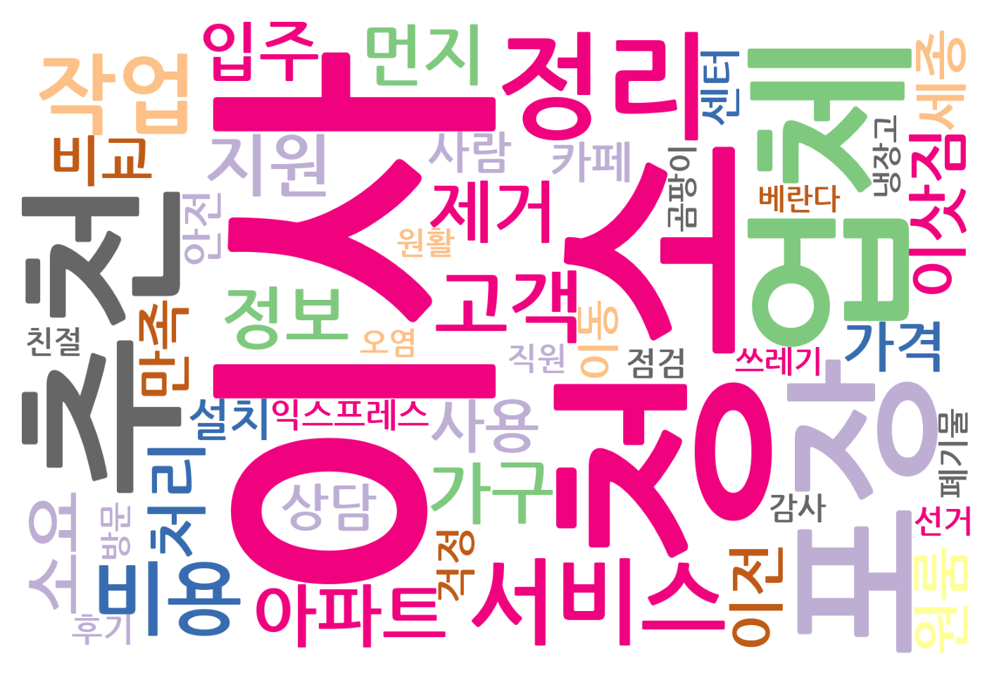

<Figure size 432x288 with 0 Axes>

In [68]:
tf_wc(0)

<Figure size 864x864 with 0 Axes>

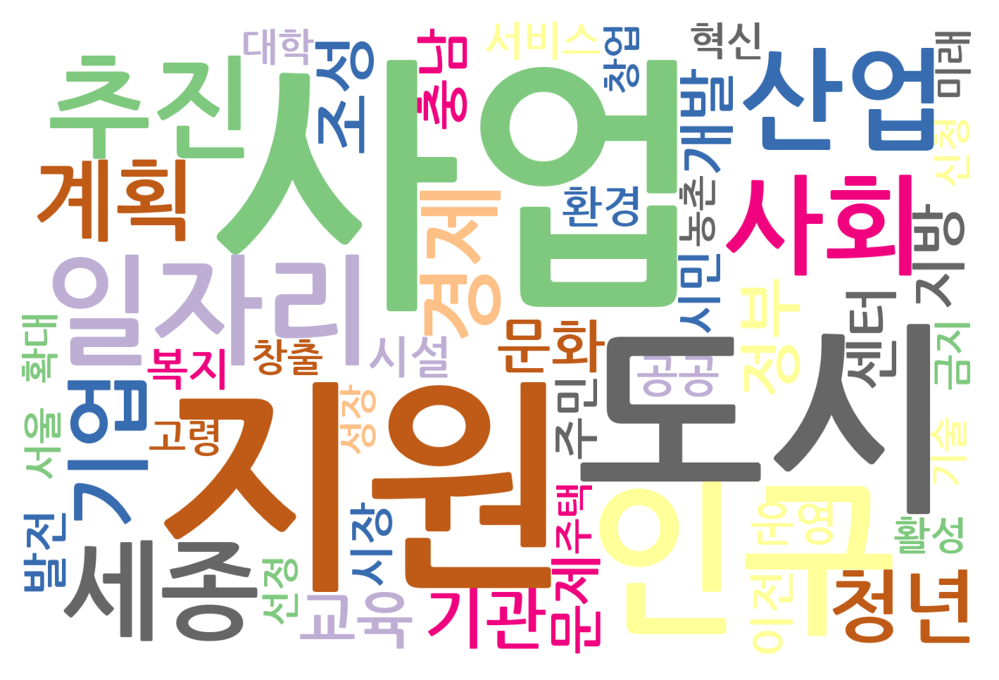

In [70]:
tf_wc(1)

<Figure size 864x864 with 0 Axes>

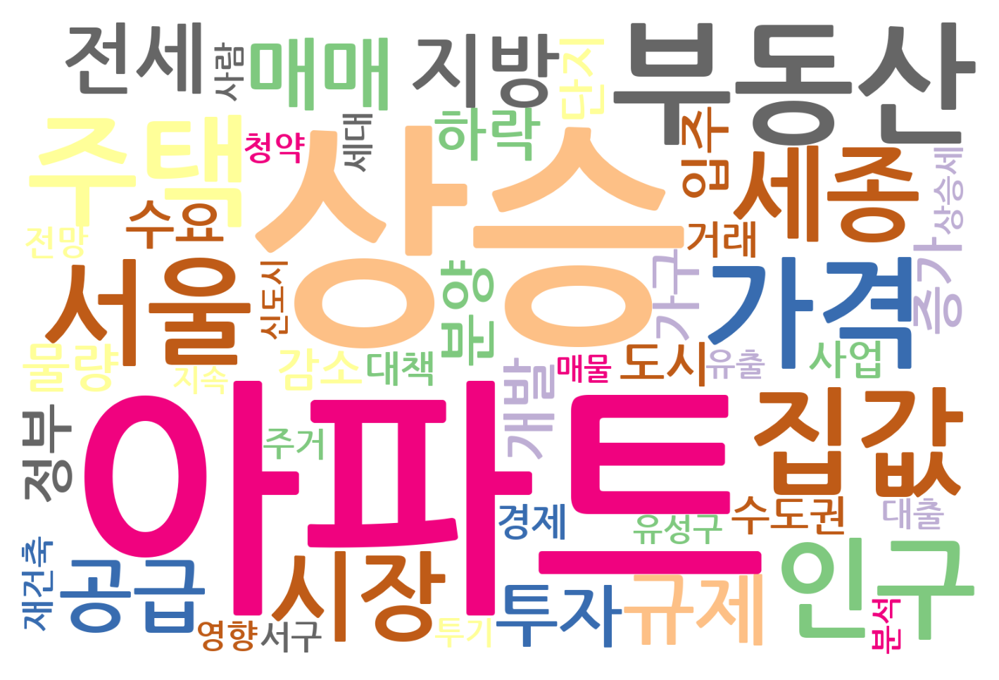

In [71]:
tf_wc(2)

<Figure size 864x864 with 0 Axes>

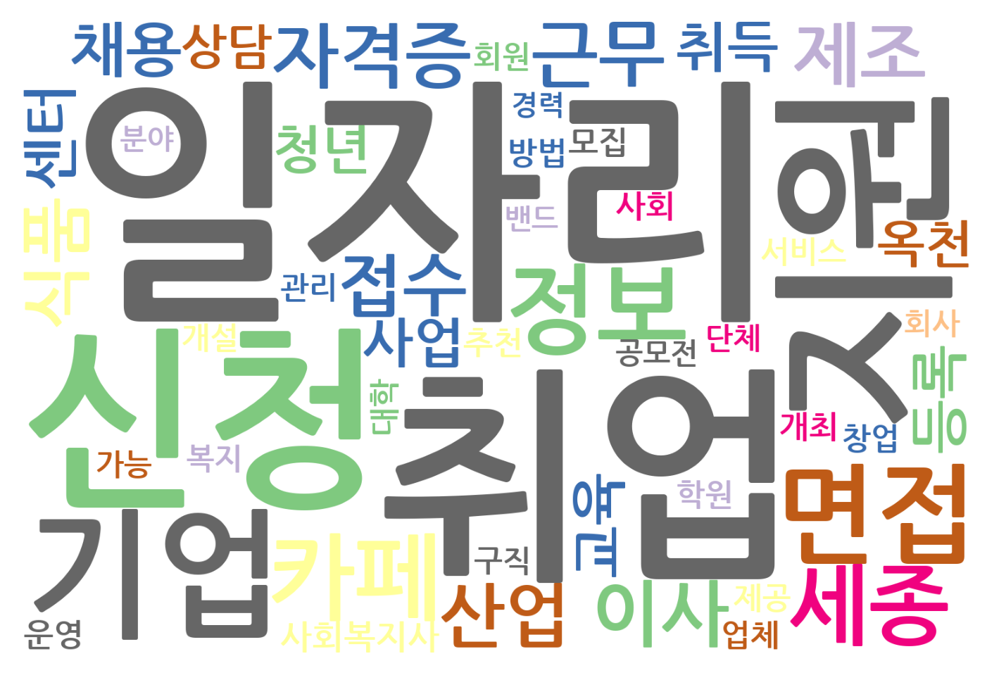

In [72]:
tf_wc(3)

<Figure size 864x864 with 0 Axes>

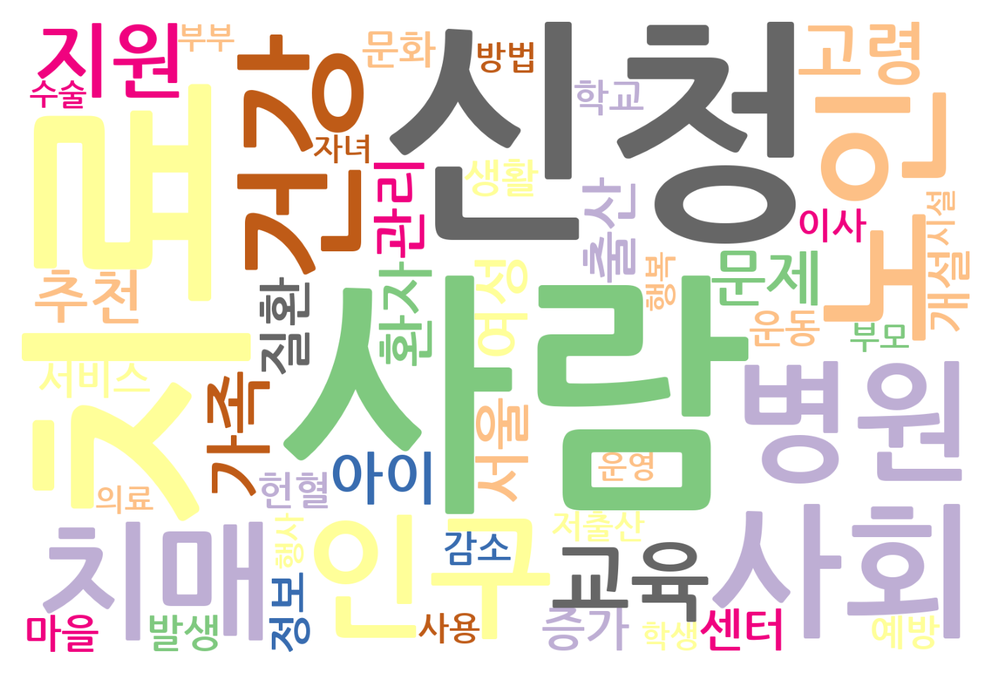

In [73]:
tf_wc(4)

# 데이터프레임에 score 삽입 - KNU감성사전이용

In [119]:
f = open(file_path + "topic5\\topic_doc.pkl", "rb")
data = pickle.load(f) # 불러오기
f.close()
data

,title,doc,url,ch,ch2,token_noun,topic
0,"[공유] 대전 인구유출.. 건설,부동산의 눈으로 보는 해법은?",대전 인구유출 건설부동산의 눈으로 보는 해법은 세종 블랙홀 대전 인구 지속 유출 빨...,https://cafe.naver.com/boodongsan0114/87179?ar...,naver,cafe,"[인구, 유출, 건설, 부동산, 세종, 인구, 지속, 유출, 인구, 유출, 세종, ...",2
1,(기사) 대전 브레이크 없는 '인구 유출',대전에 지금까지 수요보다 공급이 적어공급량이 늘어나며 부동산 거래가 활발해졌다고 인...,https://cafe.naver.com/everything1004/40924?ar...,naver,cafe,"[수요, 공급, 공급량, 부동산, 거래, 인식, 인구, 유출, 인구, 가구, 분석,...",2
2,대전 인구 유출 심화 관련~!....,리포트대전 브레이크 없는 인구 유출 기사리포트대전 브레이크 없는 인구 유출아무래도...,https://cafe.naver.com/everything1004/40939?ar...,naver,cafe,"[인구, 유출, 인구, 유출, 세종, 영향, 인구, 돌파]",2
3,150만 무너진 대전 인구 140만 명도 위험하다,만 무너진 대전 인구 만 명도 위험하다 대전일보중부권 핵심도시 대전시의 인구 하면...,https://cafe.naver.com/rinside/6426?art=ZXh0ZX...,naver,cafe,"[인구, 위험, 대전일보, 핵심, 도시, 인구, 인구 통계, 인구, 인구, 통계, ...",2
4,대전시 인구 세종시 인구유출로 147만 무너졌다...,김코치 재테크에서 대전시 세종시의 핫한 뉴스들을 매일 쉽게 올려드립니다우리가 살고...,https://cafe.naver.com/dodamdadam1004/2075015?...,naver,cafe,"[코치, 재테크, 세종, 핫이슈, 모집, 신청, 접수, 코치, 분석, 모집, 주차장...",2
...,...,...,...,...,...,...,...
15267,NaN,이슈탐사전국 상승률 위 폭등한 대전 집값의 비밀 출처 국민일보 네이버 뉴스 높...,NaN,twitter,twitter,"[이슈, 탐사, 상승, 폭등, 집값, 국민일보, 네이버 뉴스]",2
15268,NaN,대전집값이 진짜 싸네 카드사도 바로옆이고 두달정도만이라도 내려가서 돈모아야하나,NaN,twitter,twitter,"[집값, 카드사]",2
15269,NaN,매일경제 대전 집값 부산 뛰어넘었다,NaN,twitter,twitter,"[경제, 집값]",2
15270,NaN,헉 대전 집값 올라요,NaN,twitter,twitter,[집값],2


In [121]:
# 데이터프레임에 감성분석 score 삽입

import json
# 감정분석 json데이터(knu감성사전) 불러오기
with open(file_path + '\\SentiWord_info.json',encoding = 'UTF-8') as json_file:
    sentiword = json.load(json_file)

s_word = []
values = []
score = []

def average(list):  # 각 문서의 평균 감성 score 반환
    return sum(list)/len(list)

for word in tqdm(data['doc']):
    temp_s_word=[]
    temp_value=[]
    for s in sentiword:
        if s['word'] in word:
            if len(s['word']) > 1 : # 한글자 이상의 감성단어와 비교 
                temp_s_word.append(s['word'])
                temp_value.append(int(s['polarity'])) 
    s_word.append(temp_s_word) # 해당하는 감성단어 추가
    values.append(temp_value) # 해당 단어의 polarity값 추가
    try:
        score.append(average(temp_value)) # 각 문서의 평균 polarity 추가
    except ZeroDivisionError:
        score.append(int(0))

data=data.assign(sentiword = s_word,values=values,score=score) # 결과 데이터프레임에 삽입

100%|████████████████████████████████████████████████████████████████████████████| 15272/15272 [12:13<00:00, 20.83it/s]


In [122]:
import pickle

# 갱신된 데이터프레임 파일로 저장
f = open(file_path + "topic5\\total_docs.pkl", "wb")
pickle.dump(data, f)
f.close()

In [75]:
import pickle

# 불러오기
f = open(file_path + "topic5\\total_docs.pkl", "rb")
ff = pickle.load(f)
f.close()

In [76]:
import pandas as pd
total_docs = pd.DataFrame()
total_docs['doc'] = ff['doc']
total_docs['token_noun'] = ff['token_noun']
total_docs['topic'] = ff['topic']
total_docs['sentiword'] = ff['sentiword']
total_docs['values'] = ff['values']
total_docs['score'] = ff['score']
total_docs

,doc,token_noun,topic,sentiword,values,score
0,대전 인구유출 건설부동산의 눈으로 보는 해법은 세종 블랙홀 대전 인구 지속 유출 빨...,"[인구, 유출, 건설, 부동산, 세종, 인구, 지속, 유출, 인구, 유출, 세종, ...",2,"[개선, 과로, 급하고, 기대, 높은, 도움, 못하고, 성을, 실수, 아파, 안정,...","[2, -1, -1, 1, 1, 1, -2, 0, -1, -2, 1, 1, -1, ...",0.150000
1,대전에 지금까지 수요보다 공급이 적어공급량이 늘어나며 부동산 거래가 활발해졌다고 인...,"[수요, 공급, 공급량, 부동산, 거래, 인식, 인구, 유출, 인구, 가구, 분석,...",2,"[높은, 부작용, 전문가, 좋은, 최고, 축하, 활력]","[1, -2, 1, 2, 2, 2, 1]",1.000000
2,리포트대전 브레이크 없는 인구 유출 기사리포트대전 브레이크 없는 인구 유출아무래도...,"[인구, 유출, 인구, 유출, 세종, 영향, 인구, 돌파]",2,[],[],0.000000
3,만 무너진 대전 인구 만 명도 위험하다 대전일보중부권 핵심도시 대전시의 인구 하면...,"[인구, 위험, 대전일보, 핵심, 도시, 인구, 인구 통계, 인구, 인구, 통계, ...",2,"[심각성, 위험하다, 험하다]","[-2, -2, -1]",-1.666667
4,김코치 재테크에서 대전시 세종시의 핫한 뉴스들을 매일 쉽게 올려드립니다우리가 살고...,"[코치, 재테크, 세종, 핫이슈, 모집, 신청, 접수, 코치, 분석, 모집, 주차장...",2,"[부상, 상한, 쉽게, 어진, 효율적인]","[-2, -2, 1, 2, 1]",0.000000
...,...,...,...,...,...,...
15267,이슈탐사전국 상승률 위 폭등한 대전 집값의 비밀 출처 국민일보 네이버 뉴스 높...,"[이슈, 탐사, 상승, 폭등, 집값, 국민일보, 네이버 뉴스]",2,[],[],0.000000
15268,대전집값이 진짜 싸네 카드사도 바로옆이고 두달정도만이라도 내려가서 돈모아야하나,"[집값, 카드사]",2,[],[],0.000000
15269,매일경제 대전 집값 부산 뛰어넘었다,"[경제, 집값]",2,[],[],0.000000
15270,헉 대전 집값 올라요,[집값],2,[],[],0.000000


# Sentiment analysis (topic)

In [204]:
# 토픽별 평균 score 0.2 초과  -> 긍정
# 토픽별 평균 score -0.2 이상 0.2 이하  -> 중립
# 토픽별 평균 score -0.2 미만  -> 부정

senti_0 = [0,0,0]
senti_1 = [0,0,0]
senti_2 = [0,0,0]
senti_3 = [0,0,0]
senti_4 = [0,0,0]

for i in range(len(total_docs)):
    if total_docs['topic'].iloc[i] == 0:
        if total_docs['score'].iloc[i] > 0.2:  
            senti_0[0] = senti_0[0] + 1
        elif total_docs['score'].iloc[i] <= 0.2 and total_docs['score'].iloc[i] >= -0.2:
            senti_0[1] = senti_0[1] + 1
        else:
            senti_0[2] = senti_0[2] + 1
            
    elif total_docs['topic'].iloc[i] == 1:
        if total_docs['score'].iloc[i] > 0.2:  
            senti_1[0] = senti_1[0] + 1
        elif total_docs['score'].iloc[i] <= 0.2 and total_docs['score'].iloc[i] >= -0.2:
            senti_1[1] = senti_1[1] + 1
        else:
            senti_1[2] = senti_1[2] + 1
            
    elif total_docs['topic'].iloc[i] == 2:
        if total_docs['score'].iloc[i] > 0.2:  
            senti_2[0] = senti_2[0] + 1
        elif total_docs['score'].iloc[i] <= 0.2 and total_docs['score'].iloc[i] >= -0.2:
            senti_2[1] = senti_2[1] + 1
        else:
            senti_2[2] = senti_2[2] + 1
            
    elif total_docs['topic'].iloc[i] == 3:
        if total_docs['score'].iloc[i] > 0.2:  
            senti_3[0] = senti_3[0] + 1
        elif total_docs['score'].iloc[i] <= 0.2 and total_docs['score'].iloc[i] >= -0.2:
            senti_3[1] = senti_3[1] + 1
        else:
            senti_3[2] = senti_3[2] + 1
            
    else:
        if total_docs['score'].iloc[i] > 0.2:  
            senti_4[0] = senti_4[0] + 1
        elif total_docs['score'].iloc[i] <= 0.2 and total_docs['score'].iloc[i] >= -0.2:
            senti_4[1] = senti_4[1] + 1
        else:
            senti_4[2] = senti_4[2] + 1

In [214]:
senti_bar = pd.DataFrame([senti_0,senti_1,senti_2,senti_3,senti_4],
                  index=['topic1','topic2','topic3','topic4','topic5'],
                  columns=['긍정','중립','부정'])

In [215]:
senti_bar # 토픽별 긍부정 수

,긍정,중립,부정
topic1,1499,521,224
topic2,2435,910,665
topic3,1464,1364,1321
topic4,1860,518,310
topic5,1121,554,506


In [209]:
# import matplotlib.font_manager as fm
# font_list = fm.findSystemFonts(fontpaths=None,fontext='ttf')
# font_list[:30]

In [210]:
# a=fm.FontProperties(fname=font_list[30])
# a.get_name()

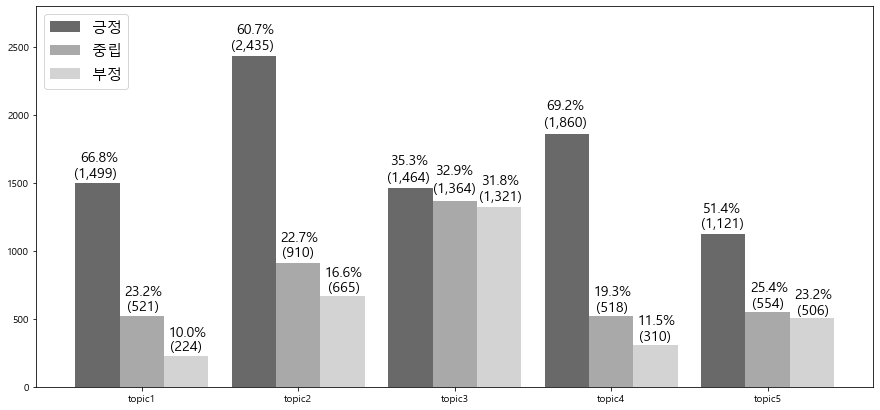

In [346]:
senti_plot = senti_bar.plot(kind='bar',
                            color=['dimgray', 'darkgray','lightgray'],
                           figsize=(15,7), rot=0, width = 0.85, ylim=[0,2800])  

senti_plot.annotate("(1,499)", (-0.445+0.3/2, 1499*1.03), ha='center',fontsize=14)
senti_plot.annotate("%.1f%%"%(66.8), (-0.425+0.3/2, 1499*1.11), ha='center',fontsize=14)
senti_plot.annotate("(2,435)", (0.555+0.3/2, 2435*1.02), ha='center',fontsize=14)
senti_plot.annotate("%.1f%%"%(60.7), (0.575+0.3/2, 2435*1.07), ha='center',fontsize=14)
senti_plot.annotate("(1,464)", (1.555+0.3/2, 1464*1.035), ha='center',fontsize=14)
senti_plot.annotate("%.1f%%"%(35.3), (1.555+0.3/2, 1464*1.12), ha='center',fontsize=14)
senti_plot.annotate("(1,860)", (2.560+0.3/2, 1860*1.03), ha='center',fontsize=14)
senti_plot.annotate("%.1f%%"%(69.2), (2.555+0.3/2, 1860*1.1), ha='center',fontsize=14)
senti_plot.annotate("(1,121)", (3.560+0.3/2, 1121*1.05), ha='center',fontsize=14)
senti_plot.annotate("%.1f%%"%(51.4), (3.555+0.3/2, 1121*1.15), ha='center',fontsize=14)

senti_plot.annotate("(521)", (-0.141+0.3/2, 521*1.08), ha='center',fontsize=14)
senti_plot.annotate("%.1f%%"%(23.2), (-0.141+0.3/2, 521*1.30), ha='center',fontsize=14)
senti_plot.annotate("(910)", (0.848+0.3/2, 910*1.06), ha='center',fontsize=14)
senti_plot.annotate("%.1f%%"%(22.7), (0.858+0.3/2, 910*1.18), ha='center',fontsize=14)
senti_plot.annotate("(1,364)", (1.848+0.3/2, 1364*1.05), ha='center',fontsize=14)
senti_plot.annotate("%.1f%%"%(32.9), (1.848+0.3/2, 1364*1.15), ha='center',fontsize=14)
senti_plot.annotate("(518)", (2.858+0.3/2, 518*1.08), ha='center',fontsize=14)
senti_plot.annotate("%.1f%%"%(19.3), (2.858+0.3/2, 518*1.3), ha='center',fontsize=14)
senti_plot.annotate("(554)", (3.850+0.3/2, 554*1.06), ha='center',fontsize=14)
senti_plot.annotate("%.1f%%"%(25.4), (3.858+0.3/2, 554*1.27), ha='center',fontsize=14)

senti_plot.annotate("(224)", (0.131+0.3/2, 224*1.2), ha='center',fontsize=14)
senti_plot.annotate("%.1f%%"%(10.0), (0.141+0.3/2, 224*1.65), ha='center',fontsize=14)
senti_plot.annotate("(665)", (1.141+0.3/2, 665*1.06), ha='center',fontsize=14)
senti_plot.annotate("%.1f%%"%(16.6), (1.141+0.3/2, 665*1.23), ha='center',fontsize=14)
senti_plot.annotate("(1,321)", (2.141+0.3/2, 1321*1.04), ha='center',fontsize=14)
senti_plot.annotate("%.1f%%"%(31.8), (2.141+0.3/2, 1321*1.13), ha='center',fontsize=14)
senti_plot.annotate("(310)", (3.131+0.3/2, 310*1.1), ha='center',fontsize=14)
senti_plot.annotate("%.1f%%"%(11.5), (3.141+0.3/2, 310*1.5), ha='center',fontsize=14)
senti_plot.annotate("(506)", (4.14+0.3/2, 506*1.06), ha='center',fontsize=14)
senti_plot.annotate("%.1f%%"%(23.2), (4.141+0.3/2, 506*1.29), ha='center',fontsize=14)

senti_plot.legend(fontsize=15,loc=2) # label 글자 크기, 위치 조정

# for p in senti_plot.patches: 
#     print(p.get_bbox().bounds)
# for p in senti_plot.patches: 
#     left, bottom, width, height = p.get_bbox().bounds 

In [77]:
# 토픽별 긍부정 단어 확인

def PN(a):
    data = total_docs[total_docs['topic']==0]
    data = data.reset_index(drop=True)
    numnum = []
    for i in range(len(data)):
        for j in range(len(data['sentiword'][i])):
            if data['values'][i][j] == a :
                  numnum.append(data['sentiword'][i][j])
    from collections import Counter #단어들을 쉽게 집계하기 위해서 사용
    count = Counter(numnum)
    hund = dict(count.most_common(25)) # 상위 25개 출력하기
    print(hund)
PN(2) 

{'좋은': 603, '좋아': 579, '만족': 567, '편하게': 502, '감사': 449, '안전': 409, '깔끔하게': 388, '친절': 371, '행복': 288, '잘하는': 191, '편안': 175, '잘해': 173, '행복한': 168, '편리': 167, '깨끗한': 154, '최고': 152, '좋을': 148, '말끔하게': 140, '친절하게': 126, '장점': 121, '잘한': 117, '좋고': 110, '좋게': 108, '편안하게': 107, '꼼꼼한': 107}


# Sentiment analysis (total)

In [132]:
# 전체 평균 score 0.2 초과  -> 긍정
# 전체 평균 score -0.2 이상 0.2 이하  -> 중립
# 전체 평균 score -0.2 미만  -> 부정

senti_total = [0,0,0]

for i in range(len(total_docs)):
    if total_docs['score'].iloc[i] > 0.2:  
        senti_total[0] = senti_total[0] + 1
    elif total_docs['score'].iloc[i] <= 0.2 and total_docs['score'].iloc[i] >= -0.2:
        senti_total[1] = senti_total[1] + 1
    else:
        senti_total[2] = senti_total[2] + 1

In [133]:
senti_bar = pd.DataFrame([senti_total],
                  index=[''],
                  columns=['긍정','중립','부정'])

In [134]:
senti_bar # 전체 긍부정 수

,긍정,중립,부정
,8379,3867,3026


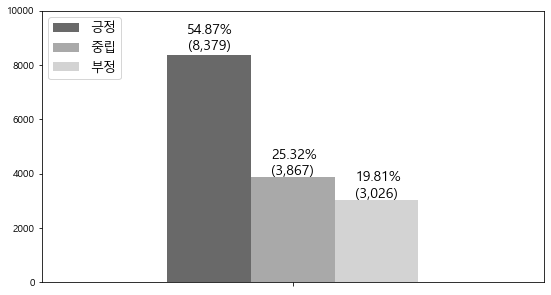

In [203]:
senti_plot = senti_bar.plot.bar(figsize=(9,5), color=['dimgray', 'darkgray','lightgray'], ylim=[0,10000]); 

senti_plot.annotate("(8,379)", (-0.316+0.3/2, 8379*1.02), ha='center',fontsize=14)    
senti_plot.annotate("%.2f%%"%(54.87), (-0.315+0.3/2, 8320*1.1), ha='center',fontsize=14)

senti_plot.annotate("(3,867)", (-0.15+0.3/2, 3870*1.025), ha='center',fontsize=14)
senti_plot.annotate("%.2f%%"%(25.32), (-0.148+0.3/2, 3890*1.17), ha='center',fontsize=14)

senti_plot.annotate("(3,026)", (0.017+0.3/2, 3026*1.03), ha='center',fontsize=14)
senti_plot.annotate("%.2f%%"%(19.81), (0.02+0.3/2, 3040*1.23), ha='center',fontsize=14)
senti_plot.legend(fontsize=13,loc=2)

# # for p in senti_plot.patches: 
# #     print(p.get_bbox().bounds)
# # for p in senti_plot.patches: 
# #     left, bottom, width, height = p.get_bbox().bounds 